# NASA: Asteroids Classification

**Acest Notebook a fost preluat/generat din/de ............... astfel**  
**- secventele de cod .... %**  
**- comentariile .... %**  
**Conributia personala a constat în ......................** _(cel putin studierea, traducerea în Ro)_  
**Valorile procentuale de mai sunt aproximative dar reflectă în esență adevărul.**

**1. Descrierea problemei**

Acesta este un set de date publicat de NASA, care conține informații despre asteroizi. Fiecare rând este un asteroid, iar fiecare coloană este o caracteristică a lui (ex: dimensiuni, viteză, etc.). Una dintre coloane (Hazardous) indică dacă asteroidul este periculos pentru Pământ, sau nu.  
Având această coloană, problema este una de clasificare supravegheată, în care trebuie prezis dacă un asteroid este „Periculos” sau „Nepericulos”.

Așadar, obiectivul problemei este de a construi un model care, dat un set de caracteristici ale unui asteroid, prezice dacă este periculos sau nu.

**2. Citirea setului de invățare și importarea bibliotecilor necesare**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

#Încărcarea setului de date
df = pd.read_csv("nasa.csv")
df.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


**3. Preprocesarea datelor**

Eliminarea caracteristicilor care nu sunt relevante

In [304]:
df = df.drop(['Neo Reference ID','Name','Orbit ID','Close Approach Date',
                'Epoch Date Close Approach','Orbit Determination Date'],axis=1)
df = df.drop(['Orbiting Body','Equinox'],axis=1)
df = df.drop(['Est Dia in M(min)', 'Est Dia in M(max)', 'Est Dia in Miles(min)',
                'Est Dia in Miles(max)', 'Est Dia in Feet(min)', 'Est Dia in Feet(max)', 
                'Relative Velocity km per hr', 'Miles per hour', 'Miss Dist.(lunar)', 
                'Miss Dist.(Astronomical)', 'Miss Dist.(miles)'], axis = 1)

# Conversie coloane booleene
df['Hazardous'] = df['Hazardous'].astype(int)

# Separare X și y
Xdf = df.drop("Hazardous", axis=1)
ydf = df["Hazardous"]

n, p = Xdf.shape
M = max(ydf) + 1

Xdf.shape, ydf.shape, M

((4687, 20), (4687,), 2)

In [305]:
Xdf.head()

,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
0,21.6,0.127220,0.284472,6.115834,62753692.0,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551
1,21.3,0.146068,0.326618,18.113985,57298148.0,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330
2,20.3,0.231502,0.517654,7.590711,7622911.5,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371
3,27.4,0.008801,0.019681,11.173874,42683616.0,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277
4,21.6,0.127220,0.284472,9.840831,61010824.0,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395


In [306]:
ydf.head()

0    1
1    0
2    1
3    0
4    1
Name: Hazardous, dtype: int64

Normalizarea datelor

In [307]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(Xdf)
X = pd.DataFrame(X_scaled, columns=Xdf.columns, index=Xdf.index)

y = ydf

**4. Analiza Explorativă a Datelor**

In [308]:
X.head()

,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
0,-0.231042,-0.209411,-0.209411,-1.077139,1.116075,0.481822,-0.631720,-0.341049,0.300904,0.238216,0.012875,-0.671955,1.377191,-0.070049,-0.021172,-1.223886,0.019571,0.459190,0.778393,-0.431100
1,-0.334824,-0.158406,-0.158406,0.568146,0.865921,-0.167955,1.158650,0.323902,0.300904,-0.171234,-0.558078,1.375315,-0.343192,-0.565393,-0.393267,1.247897,-0.514802,0.070818,-0.069093,0.312582
2,-0.680766,0.072789,0.072789,-0.874892,-1.411843,-1.142621,-0.434844,-0.403261,0.300904,-0.190223,0.111735,-0.835467,0.845573,0.021563,0.567722,0.623011,-0.021323,0.415579,1.039404,-0.522114
3,1.775418,-0.529864,-0.529864,-0.383539,0.195800,0.806711,-0.850681,0.029805,0.300904,-0.920002,-0.275446,-0.500038,-1.113477,-0.327568,0.704524,-1.596341,-0.482690,0.184540,-1.045928,-0.110818
4,-0.231042,-0.209411,-0.209411,-0.566337,1.036159,-0.817732,-0.526325,0.079090,0.300904,-0.953979,-0.333237,0.312713,-0.847599,-0.377402,0.637529,-0.248001,-0.529316,0.091457,-0.428186,-0.034580


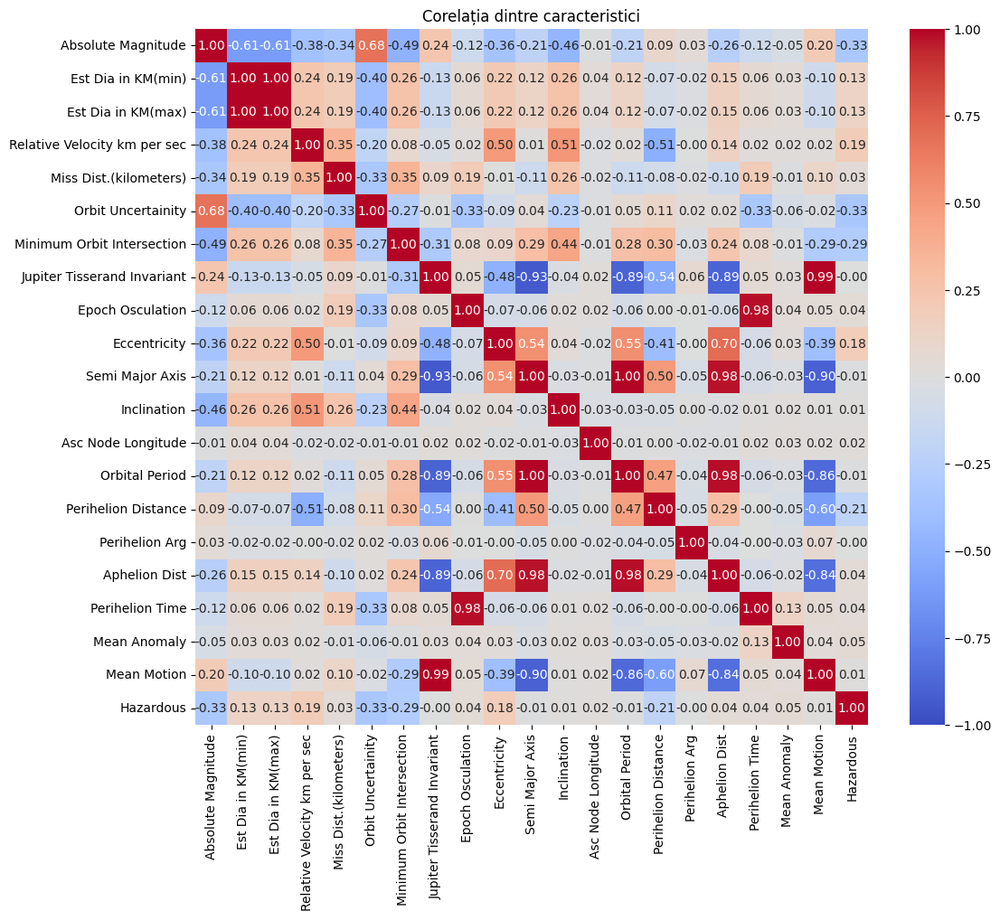

In [309]:
Xy = pd.concat([X,y], axis=1)
matcor = Xy.corr(method='pearson')

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(matcor, cmap='coolwarm', fmt=".2f",vmin=-1, vmax=1, annot=True)
plt.title("Corelația dintre caracteristici")
plt.show()

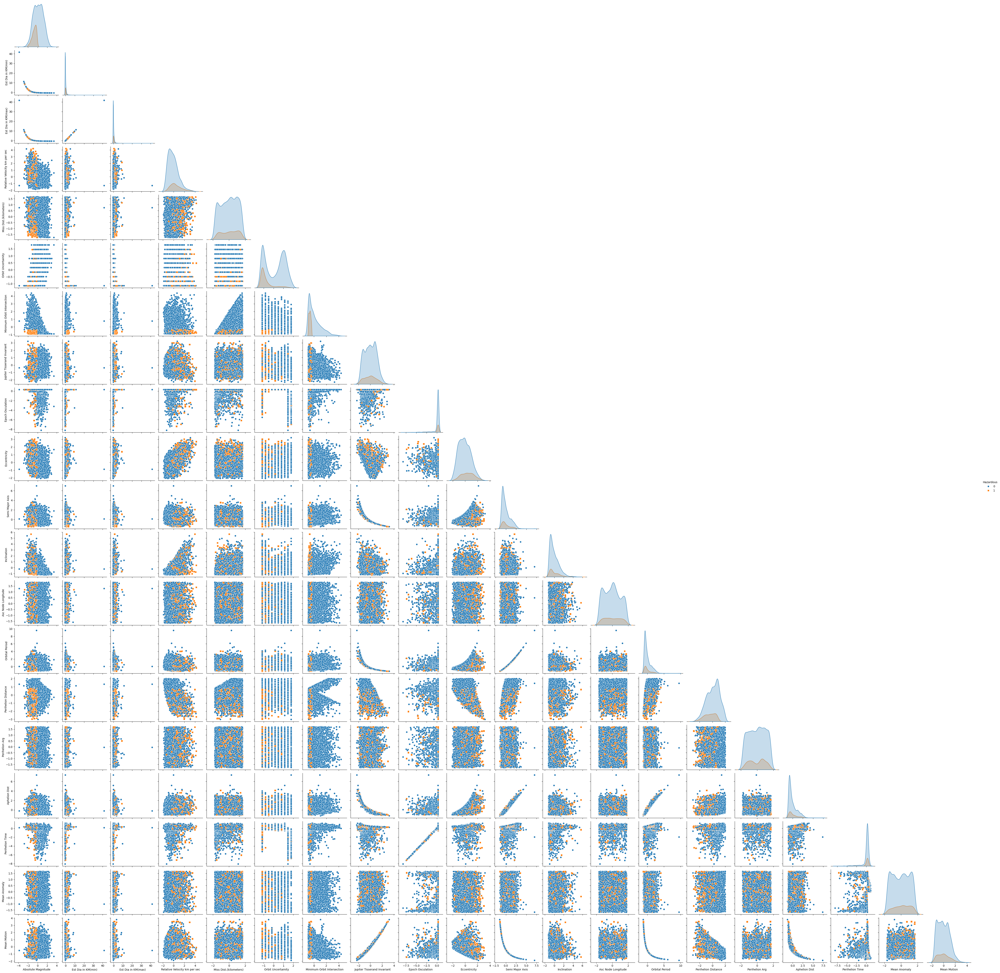

In [310]:
sns.pairplot(Xy, hue='Hazardous', markers=["o", "s"], corner=True)

In [311]:
# Check the class distribution - this is CRITICAL
print("Class Distribution:")
print(y.value_counts())
print("\nClass Distribution (percentages):")
print(y.value_counts(normalize=True) * 100)

# Basic dataset info
print(f"\nDataset shape: {Xy.shape}")
print(f"Number of features: {X.shape[1]}")
print(f"Number of samples: {X.shape[0]}")

# Check for missing values
print(f"\nMissing values: {Xy.isnull().sum().sum()}")

Class Distribution:
Hazardous
0    3932
1     755
Name: count, dtype: int64

Class Distribution (percentages):
Hazardous
0    83.891615
1    16.108385
Name: proportion, dtype: float64

Dataset shape: (4687, 21)
Number of features: 20
Number of samples: 4687

Missing values: 0


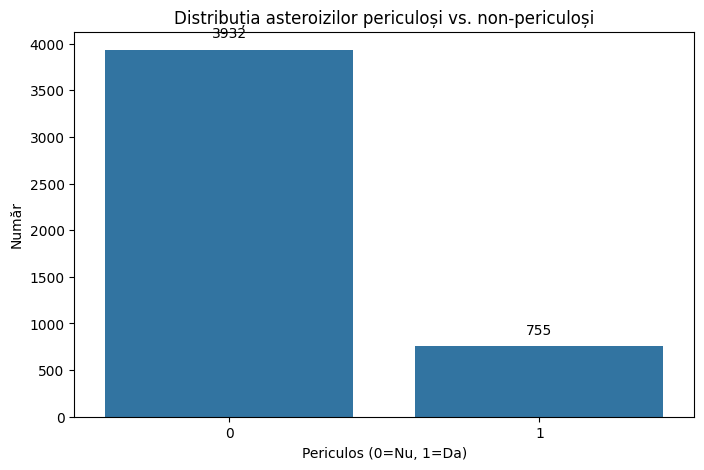

In [312]:
# Visualize class distribution
plt.figure(figsize=(8, 5))
sns.countplot(data=Xy, x='Hazardous')
plt.title("Distribuția asteroizilor periculoși vs. non-periculoși")
plt.xlabel('Periculos (0=Nu, 1=Da)')
plt.ylabel('Număr')
for i, v in enumerate(y.value_counts()):
    plt.text(i, v + 100, str(v), ha='center', va='bottom')
plt.show()

Features most correlated with 'Hazardous' (absolute correlation):
Orbit Uncertainity              0.328721
Absolute Magnitude              0.325522
Minimum Orbit Intersection      0.288949
Perihelion Distance             0.207027
Relative Velocity km per sec    0.191970
Eccentricity                    0.183269
Est Dia in KM(max)              0.132424
Est Dia in KM(min)              0.132424
Mean Anomaly                    0.054164
Epoch Osculation                0.040940
Aphelion Dist                   0.040800
Perihelion Time                 0.038113
Miss Dist.(kilometers)          0.032407
Asc Node Longitude              0.017536
Mean Motion                     0.013028
Orbital Period                  0.011168
Semi Major Axis                 0.010770
Inclination                     0.009607
Perihelion Arg                  0.003865
Jupiter Tisserand Invariant     0.003404
Name: Hazardous, dtype: float64


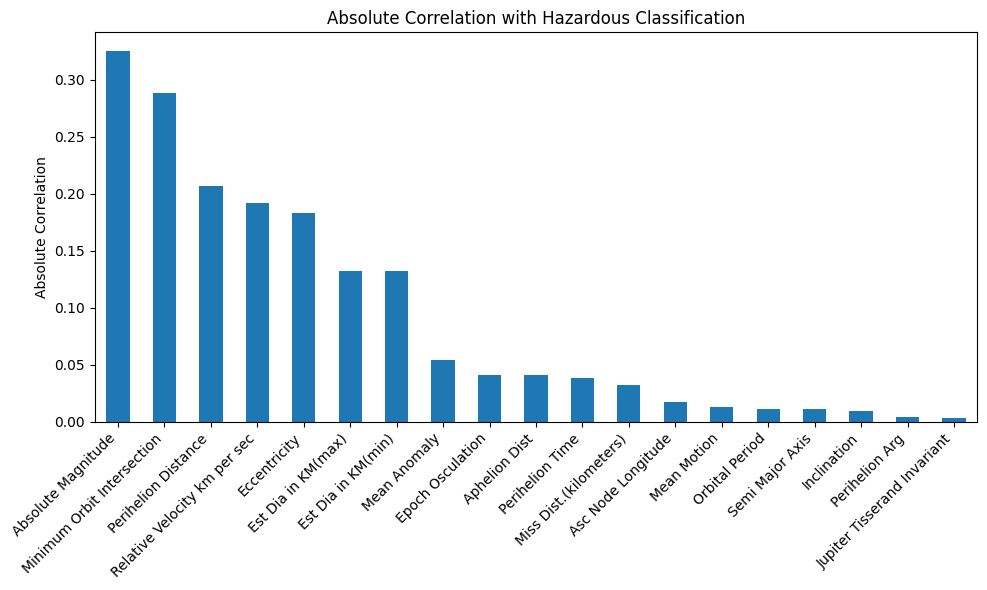

In [313]:
# Features most correlated with the target
feature_target_corr = matcor['Hazardous'].abs().sort_values(ascending=False)
print("Features most correlated with 'Hazardous' (absolute correlation):")
feature_target_corr = feature_target_corr[1:]
print(feature_target_corr)

# Visualize top correlations
plt.figure(figsize=(10, 6))
feature_target_corr[1:].plot(kind='bar')
plt.title('Absolute Correlation with Hazardous Classification')
plt.ylabel('Absolute Correlation')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [314]:
# Find highly correlated feature pairs
correlation_matrix = X.corr().abs()
upper_triangle = correlation_matrix.where(
    np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
)

# Find pairs with correlation > 0.95
high_corr_pairs = []
for column in upper_triangle.columns:
    high_corr_features = upper_triangle.index[upper_triangle[column] > 0.95].tolist()
    for feature in high_corr_features:
        high_corr_pairs.append((feature, column, upper_triangle.loc[feature, column]))

print("Highly correlated feature pairs (>0.95):")
for pair in high_corr_pairs:
    print(f"{pair[0]} <-> {pair[1]}: {pair[2]:.3f}")

Highly correlated feature pairs (>0.95):
Est Dia in KM(min) <-> Est Dia in KM(max): 1.000
Semi Major Axis <-> Orbital Period: 0.995
Semi Major Axis <-> Aphelion Dist: 0.975
Orbital Period <-> Aphelion Dist: 0.978
Epoch Osculation <-> Perihelion Time: 0.978
Jupiter Tisserand Invariant <-> Mean Motion: 0.993


In [315]:
# Select features with correlation > 0.1 with target
important_features = feature_target_corr[feature_target_corr > 0.1].index.tolist()
print(f"Important features (correlation > 0.1): {len(important_features)}")
print(important_features)

# Create reduced dataset
X_important = X[important_features]
print(f"\nReduced dataset shape: {X_important.shape}")

Important features (correlation > 0.1): 8
['Orbit Uncertainity', 'Absolute Magnitude', 'Minimum Orbit Intersection', 'Perihelion Distance', 'Relative Velocity km per sec', 'Eccentricity', 'Est Dia in KM(max)', 'Est Dia in KM(min)']

Reduced dataset shape: (4687, 8)


Correlation matrix for important features:
                              Orbit Uncertainity  Absolute Magnitude  \
Orbit Uncertainity                         1.000               0.678   
Absolute Magnitude                         0.678               1.000   
Minimum Orbit Intersection                 0.268               0.488   
Perihelion Distance                        0.108               0.087   
Relative Velocity km per sec               0.202               0.377   
Eccentricity                               0.088               0.361   
Est Dia in KM(max)                         0.399               0.613   
Est Dia in KM(min)                         0.399               0.613   

                              Minimum Orbit Intersection  Perihelion Distance  \
Orbit Uncertainity                                 0.268                0.108   
Absolute Magnitude                                 0.488                0.087   
Minimum Orbit Intersection                         1.000         

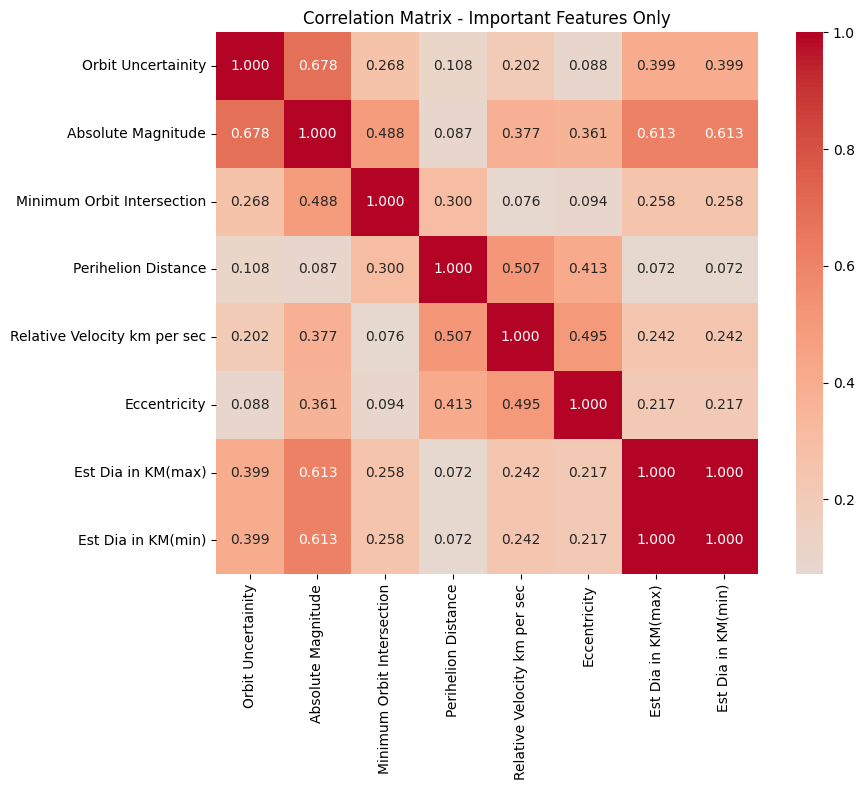


Highly correlated pairs among important features (>0.8):
Est Dia in KM(max) <-> Est Dia in KM(min): 1.000


In [316]:
# Check correlations among the selected important features
important_corr = X_important.corr().abs()
print("Correlation matrix for important features:")
print(important_corr.round(3))

# Visualize correlations among important features
plt.figure(figsize=(10, 8))
sns.heatmap(important_corr, annot=True, cmap='coolwarm', center=0, 
            square=True, fmt='.3f')
plt.title('Correlation Matrix - Important Features Only')
plt.tight_layout()
plt.show()

# Find highly correlated pairs among important features
upper_triangle = important_corr.where(
    np.triu(np.ones(important_corr.shape), k=1).astype(bool)
)

high_corr_pairs = []
for column in upper_triangle.columns:
    high_corr_features = upper_triangle.index[upper_triangle[column] > 0.8].tolist()
    for feature in high_corr_features:
        high_corr_pairs.append((feature, column, upper_triangle.loc[feature, column]))

print("\nHighly correlated pairs among important features (>0.8):")
for pair in high_corr_pairs:
    print(f"{pair[0]} <-> {pair[1]}: {pair[2]:.3f}")

In [317]:
# Remove one of the perfectly correlated diameter features
# Keep 'Est Dia in KM(max)' and remove 'Est Dia in KM(min)'
features_to_keep = [col for col in important_features if col != 'Est Dia in KM(min)']
print("Final features to keep:")
print(features_to_keep)
print(f"Number of features: {len(features_to_keep)}")

# Create final feature set
X_final = X[features_to_keep]
print(f"\nFinal dataset shape: {X_final.shape}")

# Let's also look at the final correlation with target
final_correlations = pd.concat([X_final, y], axis=1).corr()['Hazardous'].abs().sort_values(ascending=False)
print(f"\nFinal features correlation with target:")
print(final_correlations[1:])  # Exclude self-correlation

Final features to keep:
['Orbit Uncertainity', 'Absolute Magnitude', 'Minimum Orbit Intersection', 'Perihelion Distance', 'Relative Velocity km per sec', 'Eccentricity', 'Est Dia in KM(max)']
Number of features: 7

Final dataset shape: (4687, 7)

Final features correlation with target:
Orbit Uncertainity              0.328721
Absolute Magnitude              0.325522
Minimum Orbit Intersection      0.288949
Perihelion Distance             0.207027
Relative Velocity km per sec    0.191970
Eccentricity                    0.183269
Est Dia in KM(max)              0.132424
Name: Hazardous, dtype: float64


In [318]:
# Verify no perfect correlations remain
final_corr_matrix = X_final.corr().abs()
upper_triangle = final_corr_matrix.where(np.triu(np.ones(final_corr_matrix.shape), k=1).astype(bool))
max_corr = upper_triangle.max().max()
print(f"\nHighest correlation between remaining features: {max_corr:.3f}")


Highest correlation between remaining features: 0.678


In [319]:
# Train-test split with stratification (important for imbalanced data)
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y, 
    test_size=0.2, #0.2
    random_state=42, #42
    stratify=y  # Maintains class distribution in both sets
)

print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)
print("\nClass distribution in training set:")
print(y_train.value_counts(normalize=True))
print("\nClass distribution in test set:")
print(y_test.value_counts(normalize=True))

Training set shape: (3749, 7)
Test set shape: (938, 7)

Class distribution in training set:
Hazardous
0    0.83889
1    0.16111
Name: proportion, dtype: float64

Class distribution in test set:
Hazardous
0    0.839019
1    0.160981
Name: proportion, dtype: float64


In [320]:
from xgboost import XGBClassifier
# Initialize models with class balancing
models = {
    'Logistic Regression': LogisticRegression(
        class_weight='balanced', 
        random_state=42, 
        max_iter=1000
    ),
    'SVM': SVC(
        class_weight='balanced',
        probability=True,  # For ROC curves
        random_state=42
    ),
    'Naive Bayes': GaussianNB(

    ),
    'Random Forest': RandomForestClassifier(
        class_weight='balanced',
        n_estimators=100,
        random_state=42
    ),
    'XGBoost': XGBClassifier(
        #scale_pos_weight=10,  # Adjust based on class distribution
        random_state=42
    )
}

print("Models initialized:")
for name in models.keys():
    print(f"- {name}")

Models initialized:
- Logistic Regression
- SVM
- Naive Bayes
- Random Forest
- XGBoost


In [321]:
# Dictionary to store results
results = {}

print("Training and evaluating models...\n")
print("="*60)

for name, model in models.items():
    print(f"\n{name}:")
    print("-" * 30)
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None
    
    # Calculate metrics
    accuracy = (y_pred == y_test).mean()
    roc_auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else None
    
    # Store results
    results[name] = {
        'model': model,
        'accuracy': accuracy,
        'roc_auc': roc_auc,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }
    
    print(f"Accuracy: {accuracy:.4f}")
    if roc_auc:
        print(f"ROC-AUC: {roc_auc:.4f}")
    
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    print(cm)
    
    scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    print("\nCross-validation accuracy: ", scores.mean())

    print("="*60)

Training and evaluating models...


Logistic Regression:
------------------------------
Accuracy: 0.9307
ROC-AUC: 0.9871

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       787
           1       0.71      0.95      0.81       151

    accuracy                           0.93       938
   macro avg       0.85      0.94      0.89       938
weighted avg       0.95      0.93      0.93       938


Confusion Matrix:
[[730  57]
 [  8 143]]

Cross-validation accuracy:  0.9285318338934994

SVM:
------------------------------
Accuracy: 0.9478
ROC-AUC: 0.9965

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       787
           1       0.76      0.99      0.86       151

    accuracy                           0.95       938
   macro avg       0.88      0.97      0.91       938
weighted avg       0.96      0.95      0.95       938


Confusion Matrix

In [322]:
# Step 5a: Create Performance Comparison DataFrame
performance_data = []
for name, result in results.items():
    performance_data.append({
        'Model': name,
        'Accuracy': result['accuracy'],
        'ROC-AUC': result['roc_auc'] if result['roc_auc'] else 0
    })

performance_df = pd.DataFrame(performance_data)
print("Model Performance Summary:")
print(performance_df.round(4))

Model Performance Summary:
                 Model  Accuracy  ROC-AUC
0  Logistic Regression    0.9307   0.9871
1                  SVM    0.9478   0.9965
2          Naive Bayes    0.9531   0.9878
3        Random Forest    0.9989   1.0000
4              XGBoost    0.9989   1.0000


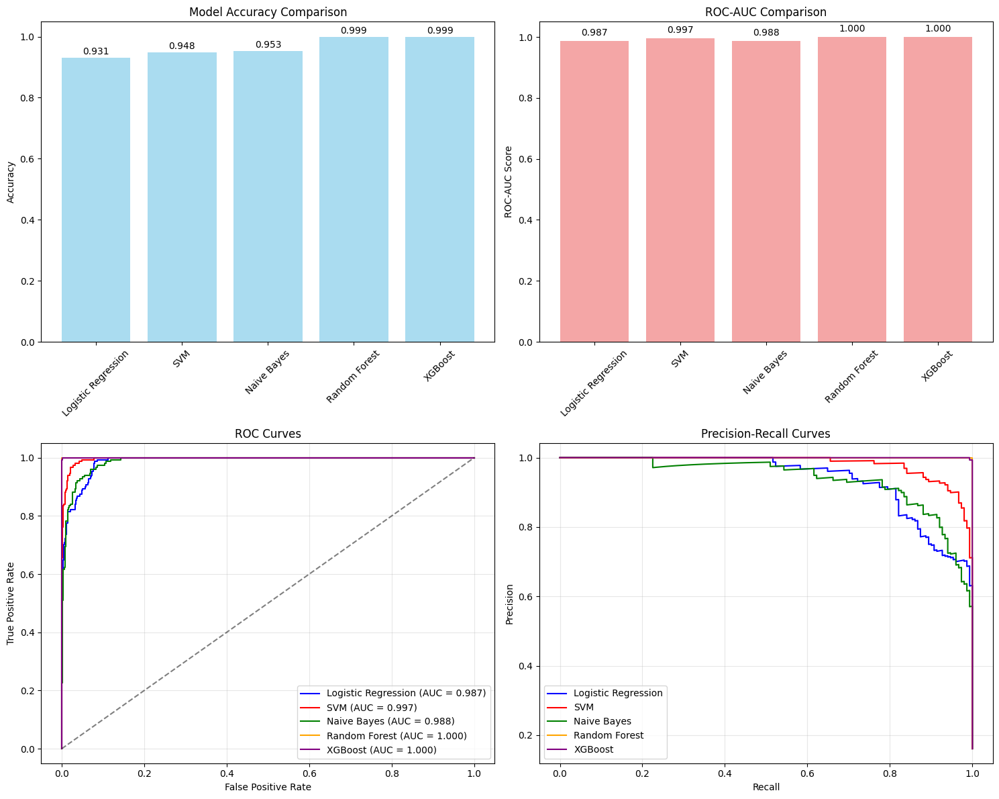

In [323]:
# Step 5b: Visualize Model Performance
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Accuracy Comparison
axes[0,0].bar(performance_df['Model'], performance_df['Accuracy'], color='skyblue', alpha=0.7)
axes[0,0].set_title('Model Accuracy Comparison')
axes[0,0].set_ylabel('Accuracy')
axes[0,0].tick_params(axis='x', rotation=45)
for i, v in enumerate(performance_df['Accuracy']):
    axes[0,0].text(i, v + 0.005, f'{v:.3f}', ha='center', va='bottom')

# 2. ROC-AUC Comparison
axes[0,1].bar(performance_df['Model'], performance_df['ROC-AUC'], color='lightcoral', alpha=0.7)
axes[0,1].set_title('ROC-AUC Comparison')
axes[0,1].set_ylabel('ROC-AUC Score')
axes[0,1].tick_params(axis='x', rotation=45)
for i, v in enumerate(performance_df['ROC-AUC']):
    axes[0,1].text(i, v + 0.01, f'{v:.3f}', ha='center', va='bottom')

# 3. ROC Curves
colors = ['blue', 'red', 'green', 'orange', 'purple']
for i, (name, result) in enumerate(results.items()):
    if result['y_pred_proba'] is not None:
        fpr, tpr, _ = roc_curve(y_test, result['y_pred_proba'])
        axes[1,0].plot(fpr, tpr, color=colors[i], 
                      label=f'{name} (AUC = {result["roc_auc"]:.3f})')

axes[1,0].plot([0, 1], [0, 1], 'k--', alpha=0.5)
axes[1,0].set_xlabel('False Positive Rate')
axes[1,0].set_ylabel('True Positive Rate')
axes[1,0].set_title('ROC Curves')
axes[1,0].legend()
axes[1,0].grid(True, alpha=0.3)

# 4. Precision-Recall Curves
for i, (name, result) in enumerate(results.items()):
    if result['y_pred_proba'] is not None:
        precision, recall, _ = precision_recall_curve(y_test, result['y_pred_proba'])
        axes[1,1].plot(recall, precision, color=colors[i], label=name)

axes[1,1].set_xlabel('Recall')
axes[1,1].set_ylabel('Precision')
axes[1,1].set_title('Precision-Recall Curves')
axes[1,1].legend()
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


OVERFITTING INVESTIGATION

Random Forest Feature Importance:
                        Feature  Importance
2    Minimum Orbit Intersection    0.468179
6            Est Dia in KM(max)    0.220406
1            Absolute Magnitude    0.164104
3           Perihelion Distance    0.061605
0            Orbit Uncertainity    0.059076
4  Relative Velocity km per sec    0.015879
5                  Eccentricity    0.010752


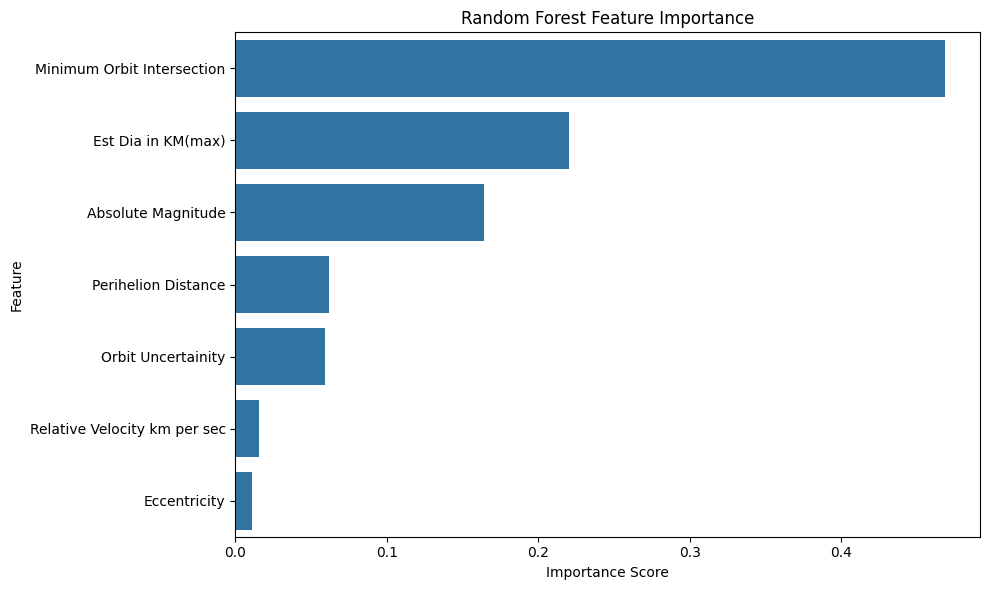

In [324]:
# Step 5c: Investigate Potential Overfitting
print("\n" + "="*60)
print("OVERFITTING INVESTIGATION")
print("="*60)

# Check feature importance for Random Forest
rf_model = results['Random Forest']['model']
feature_importance = pd.DataFrame({
    'Feature': X_final.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

print("\nRandom Forest Feature Importance:")
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance, x='Importance', y='Feature')
plt.title('Random Forest Feature Importance')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()


Generating Learning Curves...


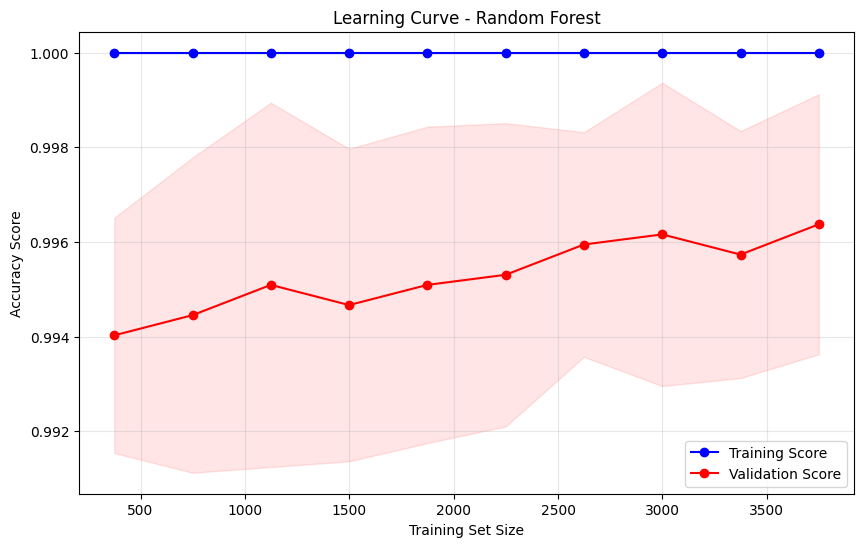

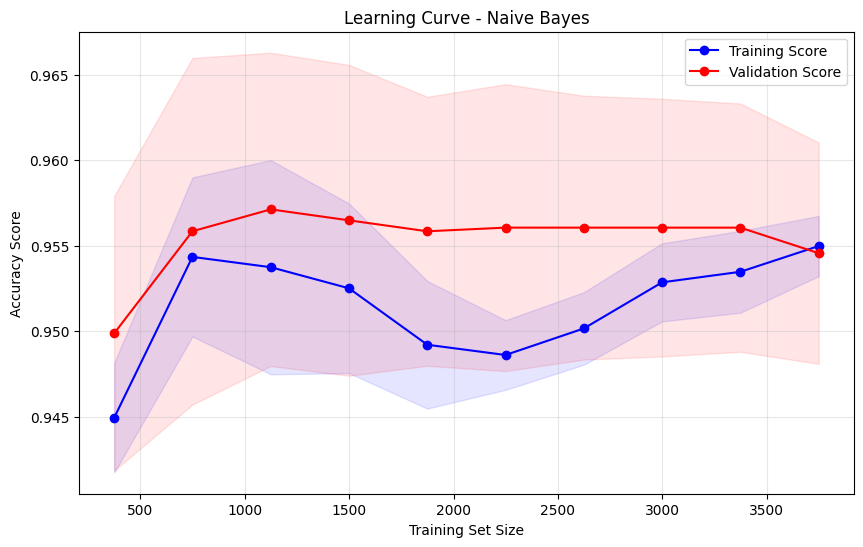

In [327]:
# Step 5d: Learning Curves to Check Overfitting
def plot_learning_curve(model, title, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model, X, y, cv=5, #n_jobs=-1, 
        train_sizes=np.linspace(0.1, 1.0, 10),
        scoring='accuracy'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
    
    plt.plot(train_sizes, val_mean, 'o-', color='red', label='Validation Score')
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1, color='red')
    
    plt.title(f'Learning Curve - {title}')
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return train_mean, val_mean

# Check learning curves for top models
print("\nGenerating Learning Curves...")
rf_train, rf_val = plot_learning_curve(
    RandomForestClassifier(class_weight='balanced', n_estimators=100, random_state=42),
    'Random Forest', X_final, y
)

nb_train, nb_val = plot_learning_curve(
    GaussianNB(), 'Naive Bayes', X_final, y
)

In [ ]:
joblib.dump(model, "asteroid_model.pkl")
joblib.dump(scaler, "scaler.pkl")

['scaler.pkl']

In [ ]:
import aplicatie_Crainiciuc_Filaret_Niculai

#aplicatie_Crainiciuc_Filaret_Niculai.predict_from_file()


**4. Modelare de învățare automata**

**5. Compararea și validarea modelelor**

**6. Implementarea**

**7. Concluzii**

**8. Referințe**

**9. Anexa**